<a href="https://colab.research.google.com/github/ravijaanthony/breast_cancer_ml/blob/main/cwk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Part 1 -  Data Understanding and Preparation
Dataset cleaning and getting rid of uselsess data

Ref: https://www.geeksforgeeks.org/how-to-load-a-dataset-from-the-google-drive-to-google-colab/


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
df=pd.read_csv("/content/drive/MyDrive/ML/CWK/5DATA002W.2 Coursework Dataset(25012025v6.0).csv")

In [ ]:
df.head()

,Patient_ID,Month_of_Birth,Age,Sex,Occupation,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Reginol_Node_Positive,Survival_Months,Mortality_Status
0,A0012,12,68.00,Female,Teaching,T1,N1,IIA,Poorly differentiated,3,Regional,4.00,Positive,Positive,24.00,1,60,Alive
1,A0013,12,50.00,Female,Medical,T2,N2,IIIA,Moderately differentiated,2,Regional,35.00,Positive,Positive,14.00,5,62,Alive
2,A0014,11,58.00,Female,Engineering,T3,N3,IIIC,Moderately differentiated,2,Regional,63.00,Positive,Positive,14.00,7,75,Alive
3,A0015,3,58.00,Female,Technology,T1,N1,IIA,Poorly differentiated,3,Regional,18.00,Positive,Positive,2.00,1,84,Alive
4,A0016,1,47.00,Female,Multimedia,T2,N1,IIB,Poorly differentiated,3,Regional,41.00,Positive,Positive,3.00,1,50,Alive


Checking the dataset for any imbalances

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4024 entries, 0 to 4023
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Patient_ID              4024 non-null   object 
 1   Month_of_Birth          4024 non-null   int64  
 2   Age                     4015 non-null   float64
 3   Sex                     4020 non-null   object 
 4   Occupation              43 non-null     object 
 5   T_Stage                 4024 non-null   object 
 6   N_Stage                 4024 non-null   object 
 7   6th_Stage               4024 non-null   object 
 8   Differentiated          4024 non-null   object 
 9   Grade                   4024 non-null   int64  
 10  A_Stage                 4024 non-null   object 
 11  Tumor_Size              4021 non-null   float64
 12  Estrogen_Status         4024 non-null   object 
 13  Progesterone_Status     4024 non-null   object 
 14  Regional_Node_Examined  4023 non-null   

Looking for what values in the dataset is empty

In [ ]:
df.isnull().sum()

,0
Patient_ID,0
Month_of_Birth,0
Age,9
Sex,4
Occupation,3981
T_Stage,0
N_Stage,0
6th_Stage,0
Differentiated,0
Grade,0


Ref: https://realpython.com/python-data-cleaning-numpy-pandas/

Removing Occupation because its not needed


In [ ]:
df['Occupation'].describe()

,Occupation
count,43
unique,40
top,House Person
freq,2


In [ ]:
df['Patient_ID'].describe()

,Patient_ID
count,4024
unique,4024
top,A4035
freq,1


In [ ]:
df['Month_of_Birth'].describe()

,Month_of_Birth
count,4024.00
mean,6.48
std,3.48
min,1.00
25%,3.00
50%,6.00
75%,10.00
max,12.00


In [ ]:
to_drop = ['Occupation','Patient_ID','Month_of_Birth']
df.drop(to_drop, inplace=True, axis=1)

<ipython-input-177-f09fa9806ecf>:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




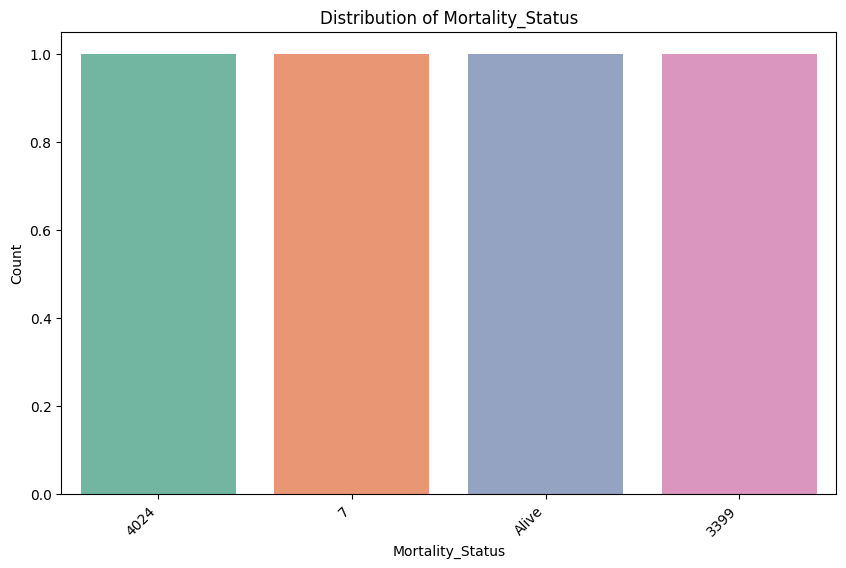

In [ ]:
mortality_status_describe = df['Mortality_Status'].describe()

plt.figure(figsize=(10, 6))
sns.countplot(data=df, x=mortality_status_describe, palette='Set2')
plt.title('Distribution of Mortality_Status')
plt.xlabel('Mortality_Status')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()

<ipython-input-178-9f00efa5cdad>:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




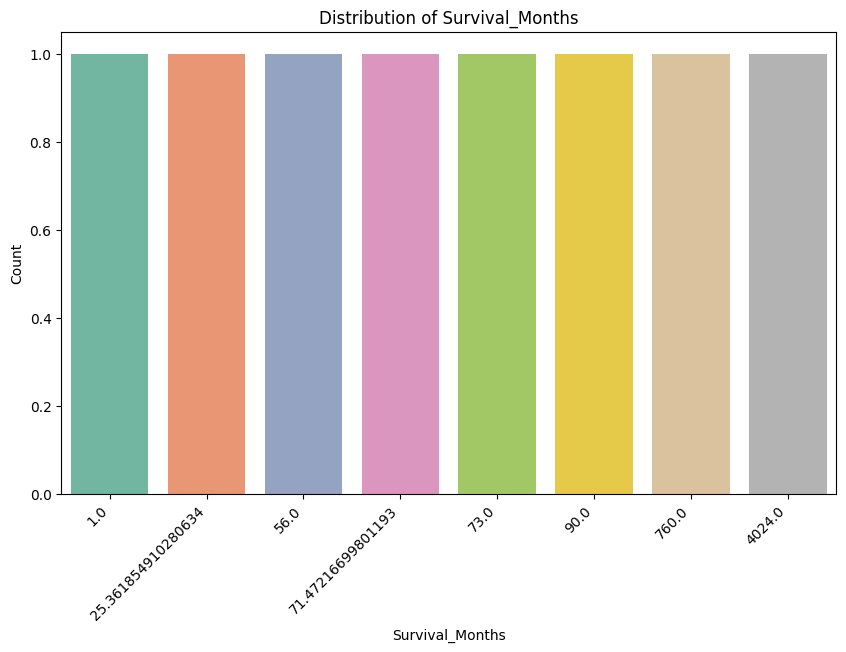

In [ ]:
survival_months_describe = df['Survival_Months'].describe()

plt.figure(figsize=(10, 6))
sns.countplot(data=df, x=survival_months_describe, palette='Set2')
plt.title('Distribution of Survival_Months')
plt.xlabel('Survival_Months')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()

Checking the dataset for any imbalances

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4024 entries, 0 to 4023
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     4015 non-null   float64
 1   Sex                     4020 non-null   object 
 2   T_Stage                 4024 non-null   object 
 3   N_Stage                 4024 non-null   object 
 4   6th_Stage               4024 non-null   object 
 5   Differentiated          4024 non-null   object 
 6   Grade                   4024 non-null   int64  
 7   A_Stage                 4024 non-null   object 
 8   Tumor_Size              4021 non-null   float64
 9   Estrogen_Status         4024 non-null   object 
 10  Progesterone_Status     4024 non-null   object 
 11  Regional_Node_Examined  4023 non-null   float64
 12  Reginol_Node_Positive   4024 non-null   int64  
 13  Survival_Months         4024 non-null   int64  
 14  Mortality_Status        4024 non-null   

removing males from the dataset

In [ ]:
df['Sex'] = df['Sex'].str.strip().str.lower()
df['Sex']=df['Sex'].replace([1,"1"], '')
df['Sex']=df['Sex'].replace([1,"nan"], '')

df['Sex'].unique()

array(['female', '', nan], dtype=object)

getting unique values for age

In [ ]:
# validating age
df=df[(df['Age'] >= 0) & (df['Age'] <= 100)]

# Convert to integers
df['Age'] = df['Age'].astype(int)

df = df.reset_index(drop=True)

<ipython-input-181-31f7747edc1d>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



getting unique values for tumor size

In [ ]:
# Remove negative values
df = df[df['Tumor_Size'] >= 0]

# Set upper bound (e.g., 150 mm)
df = df[df['Tumor_Size'] <= 150]

# Round to one decimal place
df['Tumor_Size'] = df['Tumor_Size'].round(1)

# Reset index
df = df.reset_index(drop=True)

getting unique values for morality status

In [ ]:
# convert everything in Mortality_Status to lowercase
df['Mortality_Status'] = df['Mortality_Status'].str.strip().str.lower()

In [ ]:
df = df[df['Differentiated'] != 'Undifferentiated']

In [ ]:
df = df[df['T_Stage'] != 'T4']

In [ ]:
df = df[df['A_Stage'] != 'Distant']

In [ ]:
df = df[df['Estrogen_Status'] != 'Negative']

In [ ]:
df = df[df['Progesterone_Status'] != 'Negative']

In [ ]:
for col in df.columns:
    print(f"\nUnique values in '{col}':")
    print(df[col].unique())
    print("-" * 40)


Unique values in 'Age':
[68 50 58 47 51 40 65 48 62 61 56 43 57 55 63 46 66 53 59 49 64 69 37 42
 67 31 52 33 45 60 38 39 54 36 41 44 34 35 30 32 89]
----------------------------------------

Unique values in 'Sex':
['female' '' nan]
----------------------------------------

Unique values in 'T_Stage':
['T1' 'T2' 'T3']
----------------------------------------

Unique values in 'N_Stage':
['N1' 'N2' 'N3']
----------------------------------------

Unique values in '6th_Stage':
['IIA' 'IIIA' 'IIIC' 'IIB']
----------------------------------------

Unique values in 'Differentiated':
['Poorly differentiated' 'Moderately differentiated' 'Well differentiated']
----------------------------------------

Unique values in 'Grade':
[3 2 1]
----------------------------------------

Unique values in 'A_Stage':
['Regional']
----------------------------------------

Unique values in 'Tumor_Size':
[  4.  35.  63.  18.  41.  20.   8.  30.  13.  15.  19.  46.  24.  25.
  40.  29.  22.  50.  17.  21.  10.

In [ ]:
import plotly.express as px
age_fig = px.box(df, x='Age')
sex_fig = px.box(df, x='Sex')
t_stage_fig = px.box(df, x='T_Stage')
n_stage_fig = px.box(df, x='N_Stage')
differentiated_fig = px.box(df, x='Differentiated')
grade_fig = px.box(df, x='Grade')
a_stage_fig = px.box(df, x='A_Stage')
tumor_size_fig = px.box(df, x='Tumor_Size')
estrogen_status_fig = px.box(df, x='Estrogen_Status')
progesterone_status_fig = px.box(df, x='Progesterone_Status')
regional_node_examined_fig = px.box(df, x='Regional_Node_Examined')
regional_node_positive_fig = px.box(df, x='Reginol_Node_Positive')
survival_months_fig = px.box(df, x='Survival_Months')
mortality_status_fig = px.box(df, x='Mortality_Status')

# Show the figures
age_fig.show()
sex_fig.show()
t_stage_fig.show()
n_stage_fig.show()
differentiated_fig.show()
grade_fig.show()
a_stage_fig.show()
tumor_size_fig.show()
estrogen_status_fig.show()
progesterone_status_fig.show()
regional_node_examined_fig.show()
regional_node_positive_fig.show()


##Stabalizing the dataset

Due to a future error from pd

```
df['Age'].fillna(Mean_Age, inplace=True)
```

was changed to

```
df['Age'] = df['Age'].fillna(Mean_Age)
```



In [ ]:
Mean_Age = df['Age'].mean()
Mean_Sex = df['Sex'].mode()[0] # due to a string isnt an int had to use mode()
Mean_Tumor_Size = df['Tumor_Size'].mean()
Mean_Regional_Node_Examined = df['Regional_Node_Examined'].mean()

In [ ]:
df['Age'] = df['Age'].fillna(Mean_Age)

In [ ]:
df['Sex'] = df['Sex'].fillna(Mean_Sex)

In [ ]:
df['Tumor_Size'] = df['Tumor_Size'].fillna(Mean_Tumor_Size)

In [ ]:
df['Regional_Node_Examined'] = df['Regional_Node_Examined'].fillna(Mean_Regional_Node_Examined)

In [ ]:
df.isna().sum()

,0
Age,0
Sex,0
T_Stage,0
N_Stage,0
6th_Stage,0
Differentiated,0
Grade,0
A_Stage,0
Tumor_Size,0
Estrogen_Status,0


In [ ]:
nan_rows = df.isnull().any(axis=1)
print(nan_rows)

0       False
1       False
2       False
3       False
4       False
        ...  
4002    False
4003    False
4004    False
4006    False
4007    False
Length: 3156, dtype: bool


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3156 entries, 0 to 4007
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     3156 non-null   int64  
 1   Sex                     3156 non-null   object 
 2   T_Stage                 3156 non-null   object 
 3   N_Stage                 3156 non-null   object 
 4   6th_Stage               3156 non-null   object 
 5   Differentiated          3156 non-null   object 
 6   Grade                   3156 non-null   int64  
 7   A_Stage                 3156 non-null   object 
 8   Tumor_Size              3156 non-null   float64
 9   Estrogen_Status         3156 non-null   object 
 10  Progesterone_Status     3156 non-null   object 
 11  Regional_Node_Examined  3156 non-null   float64
 12  Reginol_Node_Positive   3156 non-null   int64  
 13  Survival_Months         3156 non-null   int64  
 14  Mortality_Status        3156 non-null   objec

In [ ]:
df.describe()

,Age,Grade,Tumor_Size,Regional_Node_Examined,Reginol_Node_Positive,Survival_Months
count,3156.00,3156.00,3156.00,3156.00,3156.00,3156.00
mean,53.97,2.08,28.88,14.21,3.72,72.69
std,8.97,0.62,19.71,8.13,4.62,24.70
min,30.00,1.00,1.00,1.00,1.00,1.00
25%,47.00,2.00,15.00,9.00,1.00,57.00
50%,54.00,2.00,23.00,13.00,2.00,74.00
75%,61.00,2.00,35.00,19.00,4.00,90.00
max,89.00,3.00,140.00,61.00,41.00,760.00


In [ ]:
df.to_csv(r'/content/Prepared_Coursework_dataset.csv', index = False)

##Classification Part

y(target) = morality status<br/>
X(feature) = All other relevant columns, excluding Patient_ID, Mortality_Status, or any columns that should not be used for prediction (e.g., if they are ID-like or leakage).

In [ ]:
classification_df = pd.read_csv(r"/content/Prepared_Coursework_dataset.csv")
classification_df.head()

,Age,Sex,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Reginol_Node_Positive,Survival_Months,Mortality_Status
0,68,female,T1,N1,IIA,Poorly differentiated,3,Regional,4.00,Positive,Positive,24.00,1,60,alive
1,50,female,T2,N2,IIIA,Moderately differentiated,2,Regional,35.00,Positive,Positive,14.00,5,62,alive
2,58,female,T3,N3,IIIC,Moderately differentiated,2,Regional,63.00,Positive,Positive,14.00,7,75,alive
3,58,female,T1,N1,IIA,Poorly differentiated,3,Regional,18.00,Positive,Positive,2.00,1,84,alive
4,47,female,T2,N1,IIB,Poorly differentiated,3,Regional,41.00,Positive,Positive,3.00,1,50,alive


In [ ]:
classification_df.to_csv(r'/content/classification_dataset.csv', index = False)

##Regresstion Part

y(target) = survival months<br/>
x(features) = All other relevant columns, excluding Patient_ID, Survival_Months, or any columns that should not be used for prediction.

In [ ]:
regression_df = pd.read_csv(r"/content/Prepared_Coursework_dataset.csv")
regression_df.head()

,Age,Sex,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Reginol_Node_Positive,Survival_Months,Mortality_Status
0,68,female,T1,N1,IIA,Poorly differentiated,3,Regional,4.00,Positive,Positive,24.00,1,60,alive
1,50,female,T2,N2,IIIA,Moderately differentiated,2,Regional,35.00,Positive,Positive,14.00,5,62,alive
2,58,female,T3,N3,IIIC,Moderately differentiated,2,Regional,63.00,Positive,Positive,14.00,7,75,alive
3,58,female,T1,N1,IIA,Poorly differentiated,3,Regional,18.00,Positive,Positive,2.00,1,84,alive
4,47,female,T2,N1,IIB,Poorly differentiated,3,Regional,41.00,Positive,Positive,3.00,1,50,alive


In [ ]:
regression_df.to_csv("regression_dataset.csv", index=False)

# Part 2 -  Classification Modelling & Hyperparameters Tuning

## modeling the model for classification and regression

##### you are expected to build Logistic Regression, Naïve Bayes and K Nearest Neighbour models for cancer mortality status prediction and optimise their hyperparameters.

**T_stage** refers to the size and extent of the primary tumor, where "T" stands for "tumor," with increasing numbers indicating a larger or more invasive tumor: T0 means no evidence of a tumor, T1 indicates a small tumor (less than 2cm), T2 is a tumor between 2-5cm, and T3 is a tumor larger than 5cm; the most advanced stage, T4, signifies a tumor that has grown into the chest wall or skin.

**N_stage**  refers to whether and how much the cancer has spread to nearby lymph nodes, with "N0" indicating no lymph node involvement and increasing numbers like "N1", "N2", and "N3" signifying increasing levels of lymph node involvement; essentially, a higher "N" number means the cancer has spread to more lymph nodes.

**6th_stage** there is no such stage https://pathology.jhu.edu/breast/staging-grade/

**A_stage** "Stage 1 breast cancer" refers to the earliest stage of invasive breast cancer, where the tumor is small and confined to the breast tissue, with minimal or no spread to nearby lymph nodes; essentially meaning the cancer is only found within the breast itself and has not spread to other parts of the body.

**grade** Breast cancer grade is a measure of how much cancer cells look like normal breast cells.

**Differentiated** breast cancer is a term used to describe how closely breast cancer cells resemble normal breast cells. It's also known as the grade of breast cancer.

##Classification Part

In [ ]:
classification_df = pd.read_csv("/content/classification_dataset.csv")
classification_df.head()

,Age,Sex,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Reginol_Node_Positive,Survival_Months,Mortality_Status
0,68,female,T1,N1,IIA,Poorly differentiated,3,Regional,4.00,Positive,Positive,24.00,1,60,alive
1,50,female,T2,N2,IIIA,Moderately differentiated,2,Regional,35.00,Positive,Positive,14.00,5,62,alive
2,58,female,T3,N3,IIIC,Moderately differentiated,2,Regional,63.00,Positive,Positive,14.00,7,75,alive
3,58,female,T1,N1,IIA,Poorly differentiated,3,Regional,18.00,Positive,Positive,2.00,1,84,alive
4,47,female,T2,N1,IIB,Poorly differentiated,3,Regional,41.00,Positive,Positive,3.00,1,50,alive


In [ ]:
classification_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3156 entries, 0 to 3155
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     3156 non-null   int64  
 1   Sex                     3141 non-null   object 
 2   T_Stage                 3156 non-null   object 
 3   N_Stage                 3156 non-null   object 
 4   6th_Stage               3156 non-null   object 
 5   Differentiated          3156 non-null   object 
 6   Grade                   3156 non-null   int64  
 7   A_Stage                 3156 non-null   object 
 8   Tumor_Size              3156 non-null   float64
 9   Estrogen_Status         3156 non-null   object 
 10  Progesterone_Status     3156 non-null   object 
 11  Regional_Node_Examined  3156 non-null   float64
 12  Reginol_Node_Positive   3156 non-null   int64  
 13  Survival_Months         3156 non-null   int64  
 14  Mortality_Status        3156 non-null   

####Logistic Regression

In [ ]:
classification_df.describe()

,Age,Grade,Tumor_Size,Regional_Node_Examined,Reginol_Node_Positive,Survival_Months
count,3156.00,3156.00,3156.00,3156.00,3156.00,3156.00
mean,53.97,2.08,28.88,14.21,3.72,72.69
std,8.97,0.62,19.71,8.13,4.62,24.70
min,30.00,1.00,1.00,1.00,1.00,1.00
25%,47.00,2.00,15.00,9.00,1.00,57.00
50%,54.00,2.00,23.00,13.00,2.00,74.00
75%,61.00,2.00,35.00,19.00,4.00,90.00
max,89.00,3.00,140.00,61.00,41.00,760.00


In [ ]:
Mode_Sex = classification_df['Sex'].mode()[0] # due to a string isnt an int had to use mode()
classification_df['Sex'] = classification_df['Sex'].fillna(Mode_Sex)

In [ ]:
classification_df.isna().sum()

,0
Age,0
Sex,0
T_Stage,0
N_Stage,0
6th_Stage,0
Differentiated,0
Grade,0
A_Stage,0
Tumor_Size,0
Estrogen_Status,0


In [ ]:
classification_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3156 entries, 0 to 3155
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     3156 non-null   int64  
 1   Sex                     3156 non-null   object 
 2   T_Stage                 3156 non-null   object 
 3   N_Stage                 3156 non-null   object 
 4   6th_Stage               3156 non-null   object 
 5   Differentiated          3156 non-null   object 
 6   Grade                   3156 non-null   int64  
 7   A_Stage                 3156 non-null   object 
 8   Tumor_Size              3156 non-null   float64
 9   Estrogen_Status         3156 non-null   object 
 10  Progesterone_Status     3156 non-null   object 
 11  Regional_Node_Examined  3156 non-null   float64
 12  Reginol_Node_Positive   3156 non-null   int64  
 13  Survival_Months         3156 non-null   int64  
 14  Mortality_Status        3156 non-null   

ref: https://www.datacamp.com/tutorial/case-conversion-python

In [ ]:
# convert everything in Mortality_Status to lowercase
# clean_df['Mortality_Status'] = clean_df['Mortality_Status'].str.strip().str.lower()

In [ ]:
classification_exclude = ['Mortality_Status', 'Survival_Months']
# feature
X = classification_df.drop(columns=classification_exclude)

# target
y = classification_df['Mortality_Status']

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3156 entries, 0 to 3155
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     3156 non-null   int64  
 1   Sex                     3156 non-null   object 
 2   T_Stage                 3156 non-null   object 
 3   N_Stage                 3156 non-null   object 
 4   6th_Stage               3156 non-null   object 
 5   Differentiated          3156 non-null   object 
 6   Grade                   3156 non-null   int64  
 7   A_Stage                 3156 non-null   object 
 8   Tumor_Size              3156 non-null   float64
 9   Estrogen_Status         3156 non-null   object 
 10  Progesterone_Status     3156 non-null   object 
 11  Regional_Node_Examined  3156 non-null   float64
 12  Reginol_Node_Positive   3156 non-null   int64  
dtypes: float64(2), int64(3), object(8)
memory usage: 320.7+ KB


In [ ]:
Differenciated_mode = X['Differentiated'].mode()[0]
X['Differentiated'] = X['Differentiated'].fillna(Differenciated_mode)

In [ ]:
classification_df['Differentiated'] = X['Differentiated']

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3156 entries, 0 to 3155
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     3156 non-null   int64  
 1   Sex                     3156 non-null   object 
 2   T_Stage                 3156 non-null   object 
 3   N_Stage                 3156 non-null   object 
 4   6th_Stage               3156 non-null   object 
 5   Differentiated          3156 non-null   object 
 6   Grade                   3156 non-null   int64  
 7   A_Stage                 3156 non-null   object 
 8   Tumor_Size              3156 non-null   float64
 9   Estrogen_Status         3156 non-null   object 
 10  Progesterone_Status     3156 non-null   object 
 11  Regional_Node_Examined  3156 non-null   float64
 12  Reginol_Node_Positive   3156 non-null   int64  
dtypes: float64(2), int64(3), object(8)
memory usage: 320.7+ KB


Label encoding for sex

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
X['Sex'] = le.fit_transform(X['Sex'])

In [ ]:
classification_df['Sex'] = X['Sex']

Label encoding for T_Stage

In [ ]:
X['T_Stage'] = le.fit_transform(X['T_Stage'])

In [ ]:
classification_df['T_Stage'] = X['T_Stage']

Label encoding for T_Stage

In [ ]:
X['N_Stage'] = le.fit_transform(X['N_Stage'])

In [ ]:
classification_df['N_Stage'] = X['N_Stage']

Label encoding for Differentiated

In [ ]:
mapping_differentiated = {
    'Poorly differentiated': 0,
    'Moderately differentiated': 1,
    'Well differentiated': 2
}
X['Differentiated'] = X['Differentiated'].map(mapping_differentiated)

In [ ]:
classification_df['Differentiated'] = X['Differentiated']

Label encoding for A_Stage

In [ ]:
X['A_Stage'] = le.fit_transform(X['A_Stage'])
classification_df['A_Stage'] = X['A_Stage']

In [ ]:
X['Estrogen_Status'] = le.fit_transform(X['Estrogen_Status'])
classification_df['Estrogen_Status'] = X['Estrogen_Status']

In [ ]:
X['Progesterone_Status'] = le.fit_transform(X['Progesterone_Status'])
classification_df['Progesterone_Status'] = X['Progesterone_Status']

In [ ]:
X['6th_Stage'] = le.fit_transform(X['6th_Stage'])
classification_df['6th_Stage'] = X['6th_Stage']

In [ ]:
# standardization to scale your input feature
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X1 = scaler.fit_transform(X)

fixing the data Nan issue in index 5 of X1

In [ ]:
X1_df = pd.DataFrame(X1)
X1_df[5] = X1_df[5].fillna(X1_df[5].median())

# Check for NaN values
print(X1_df.isna().sum())
X1 = scaler.fit_transform(X1_df)

0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
11    0
12    0
dtype: int64


In [ ]:
X1_df = pd.DataFrame(X1)
# X1_df.info()


X1_df = pd.DataFrame(X1)
X1_df[6] = X1_df[6].fillna(X1_df[5].median())

# Check for NaN values
print(X1_df.isna().sum())
X1 = scaler.fit_transform(X1_df)

0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
11    0
12    0
dtype: int64


Spiliting the dataset into training and testing

In [ ]:
# split X and y into training and testing sets
from sklearn.model_selection import train_test_split
X1_train,X1_test,y_train,y_test=train_test_split(X1,y,test_size=0.25,random_state=0)
print('Whole Data shape', classification_df.shape)
print('X1_train shape', X1_train.shape)
print('X1_test shape', X1_test.shape)

Whole Data shape (3156, 15)
X1_train shape (2367, 13)
X1_test shape (789, 13)


In [ ]:
Differenciated_mode = X['Differentiated'].mode()[0]
X['Differentiated'] = X['Differentiated'].fillna(Differenciated_mode)

Instantiate the model

In [ ]:
print(X.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3156 entries, 0 to 3155
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     3156 non-null   int64  
 1   Sex                     3156 non-null   int64  
 2   T_Stage                 3156 non-null   int64  
 3   N_Stage                 3156 non-null   int64  
 4   6th_Stage               3156 non-null   int64  
 5   Differentiated          3156 non-null   int64  
 6   Grade                   3156 non-null   int64  
 7   A_Stage                 3156 non-null   int64  
 8   Tumor_Size              3156 non-null   float64
 9   Estrogen_Status         3156 non-null   int64  
 10  Progesterone_Status     3156 non-null   int64  
 11  Regional_Node_Examined  3156 non-null   float64
 12  Reginol_Node_Positive   3156 non-null   int64  
dtypes: float64(2), int64(11)
memory usage: 320.7 KB
None


In [ ]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()
logreg.fit(X1_train, y_train)
y_pred = logreg.predict (X1_test)

In [ ]:
y_pred

array(['alive', 'alive', 'alive', 'alive', 'alive', 'alive', 'alive',
       'alive', 'alive', 'alive', 'alive', 'alive', 'alive', 'alive',
       'alive', 'alive', 'alive', 'alive', 'alive', 'alive', 'alive',
       'alive', 'alive', 'alive', 'alive', 'alive', 'alive', 'alive',
       'alive', 'alive', 'alive', 'alive', 'alive', 'alive', 'alive',
       'alive', 'alive', 'alive', 'alive', 'alive', 'alive', 'alive',
       'alive', 'alive', 'alive', 'alive', 'alive', 'alive', 'alive',
       'alive', 'alive', 'alive', 'alive', 'alive', 'alive', 'alive',
       'alive', 'alive', 'alive', 'alive', 'alive', 'alive', 'alive',
       'alive', 'alive', 'alive', 'alive', 'alive', 'alive', 'alive',
       'alive', 'alive', 'alive', 'alive', 'alive', 'alive', 'alive',
       'alive', 'alive', 'alive', 'alive', 'alive', 'alive', 'alive',
       'alive', 'alive', 'alive', 'alive', 'alive', 'alive', 'alive',
       'alive', 'alive', 'alive', 'alive', 'alive', 'alive', 'alive',
       'alive', 'ali

In [ ]:
Comparison_df = pd.DataFrame({'Actual':y_test,'Predicted':y_pred})
Comparison_df.to_csv(r'/content/Comparison_df.csv', index=True)
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)
pd.set_option('display.width', 200)
Comparison_df

,Actual,Predicted
953,alive,alive
1160,alive,alive
2328,alive,alive
483,alive,alive
1079,alive,alive
...,...,...
2967,alive,alive
3056,alive,alive
1313,alive,alive
2786,alive,alive


Confusion Matrix

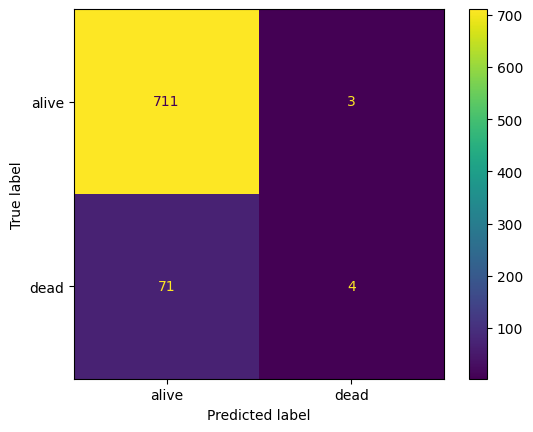

In [ ]:
# To plot the confusion matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
# Construct the confusion matrix cm
cm = confusion_matrix(y_test, y_pred, labels=logreg.classes_)
# Create a display to plot the confusion matrix
disp = ConfusionMatrixDisplay(cm,display_labels=logreg.classes_)
disp.plot()

Accuracy of the Logistic Regression model

In [ ]:
# Import the function to calculate accuracy score
from sklearn.metrics import accuracy_score
# Apply the function to find the correct predictions
accuracy = accuracy_score(y_test,y_pred)
# Display the accuracy
print ('The Logistic Regression Model Accuracy:',accuracy)

The Logistic Regression Model Accuracy: 0.9062103929024081


Classification matrix report

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       alive       0.91      1.00      0.95       714
        dead       0.57      0.05      0.10        75

    accuracy                           0.91       789
   macro avg       0.74      0.52      0.52       789
weighted avg       0.88      0.91      0.87       789



ROC curve

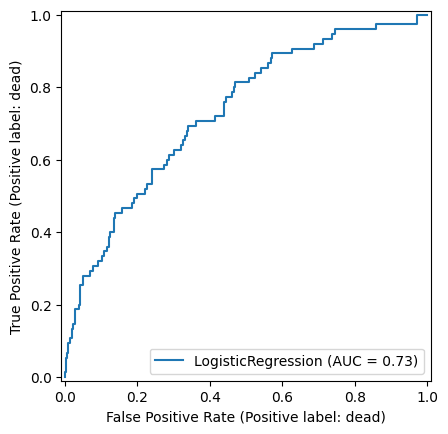

In [ ]:
# Import the function from the package
from sklearn.metrics import RocCurveDisplay
# Apply the function by specifying the name of your model and test data.
Logreg_roc = RocCurveDisplay.from_estimator(logreg, X1_test, y_test)

In [ ]:
classification_df.to_csv(r'/content/classification_dataset.csv', index=True)

##k-Nearest-Neighbours (k-NN) Model

In [ ]:
Comparison_df=pd.read_csv(r'/content/classification_dataset.csv')
df.head()

,Age,Sex,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Reginol_Node_Positive,Survival_Months,Mortality_Status
0,68,female,T1,N1,IIA,Poorly differentiated,3,Regional,4.00,Positive,Positive,24.00,1,60,alive
1,50,female,T2,N2,IIIA,Moderately differentiated,2,Regional,35.00,Positive,Positive,14.00,5,62,alive
2,58,female,T3,N3,IIIC,Moderately differentiated,2,Regional,63.00,Positive,Positive,14.00,7,75,alive
3,58,female,T1,N1,IIA,Poorly differentiated,3,Regional,18.00,Positive,Positive,2.00,1,84,alive
4,47,female,T2,N1,IIB,Poorly differentiated,3,Regional,41.00,Positive,Positive,3.00,1,50,alive


In [ ]:
Comparison_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3156 entries, 0 to 3155
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Unnamed: 0              3156 non-null   int64  
 1   Age                     3156 non-null   int64  
 2   Sex                     3156 non-null   int64  
 3   T_Stage                 3156 non-null   int64  
 4   N_Stage                 3156 non-null   int64  
 5   6th_Stage               3156 non-null   int64  
 6   Differentiated          3156 non-null   int64  
 7   Grade                   3156 non-null   int64  
 8   A_Stage                 3156 non-null   int64  
 9   Tumor_Size              3156 non-null   float64
 10  Estrogen_Status         3156 non-null   int64  
 11  Progesterone_Status     3156 non-null   int64  
 12  Regional_Node_Examined  3156 non-null   float64
 13  Reginol_Node_Positive   3156 non-null   int64  
 14  Survival_Months         3156 non-null   

In [ ]:
Comparison_df = Comparison_df.drop(columns=['Unnamed: 0'])

In [ ]:
Comparison_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3156 entries, 0 to 3155
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     3156 non-null   int64  
 1   Sex                     3156 non-null   int64  
 2   T_Stage                 3156 non-null   int64  
 3   N_Stage                 3156 non-null   int64  
 4   6th_Stage               3156 non-null   int64  
 5   Differentiated          3156 non-null   int64  
 6   Grade                   3156 non-null   int64  
 7   A_Stage                 3156 non-null   int64  
 8   Tumor_Size              3156 non-null   float64
 9   Estrogen_Status         3156 non-null   int64  
 10  Progesterone_Status     3156 non-null   int64  
 11  Regional_Node_Examined  3156 non-null   float64
 12  Reginol_Node_Positive   3156 non-null   int64  
 13  Survival_Months         3156 non-null   int64  
 14  Mortality_Status        3156 non-null   

In [ ]:
Comparison_df.shape

(3156, 15)

In [ ]:
# import plotly.express as px
# #Construct a bar graph for Traffic_Type target variable
# Traffic_Type_fig = px.bar(Comparison_df, x = 'Mortality_Status', title = "Mortality_Status")

# #Construct a bar graph for Intrusion_Traffic_Type target variable
# Intrusion_Traffic_Type_fig = px.bar(Comparison_df, x ='Predicted', title =" Predicted")

# #Construct a bivariate bar graph for both target variable
# Intrusion_Types_Per_Traffic_fig = px.bar(Comparison_df,x ='Actual', color = 'Predicted', title = "Actual data vs Predicted data", color_discrete_sequence = px.colors.qualitative.Vivid)

# #Remove the bar outline by setting the marker.line.width attribute to 0
# Traffic_Type_fig.update_traces(dict(marker_line_width=0))
# Intrusion_Traffic_Type_fig.update_traces(dict(marker_line_width=0))
# Intrusion_Types_Per_Traffic_fig.update_traces(dict(marker_line_width=0))

# #Plot all constructed bar graphs
# Traffic_Type_fig.show()
# Intrusion_Traffic_Type_fig.show()
# Intrusion_Types_Per_Traffic_fig.show()


In [ ]:
#create a dataframe with all training data except the target column
X = Comparison_df.drop(columns=['Mortality_Status','Survival_Months'])
# here, we select one target variable to model, Traffic_Type
y = Comparison_df['Mortality_Status']
#check that the list of input variables
list(X)

['Age',
 'Sex',
 'T_Stage',
 'N_Stage',
 '6th_Stage',
 'Differentiated',
 'Grade',
 'A_Stage',
 'Tumor_Size',
 'Estrogen_Status',
 'Progesterone_Status',
 'Regional_Node_Examined',
 'Reginol_Node_Positive']

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3156 entries, 0 to 3155
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     3156 non-null   int64  
 1   Sex                     3156 non-null   int64  
 2   T_Stage                 3156 non-null   int64  
 3   N_Stage                 3156 non-null   int64  
 4   6th_Stage               3156 non-null   int64  
 5   Differentiated          3156 non-null   int64  
 6   Grade                   3156 non-null   int64  
 7   A_Stage                 3156 non-null   int64  
 8   Tumor_Size              3156 non-null   float64
 9   Estrogen_Status         3156 non-null   int64  
 10  Progesterone_Status     3156 non-null   int64  
 11  Regional_Node_Examined  3156 non-null   float64
 12  Reginol_Node_Positive   3156 non-null   int64  
dtypes: float64(2), int64(11)
memory usage: 320.7 KB


In [ ]:
Differenciated_mode = X['Differentiated'].mode()[0]
X['Differentiated'] = X['Differentiated'].fillna(Differenciated_mode)

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3156 entries, 0 to 3155
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     3156 non-null   int64  
 1   Sex                     3156 non-null   int64  
 2   T_Stage                 3156 non-null   int64  
 3   N_Stage                 3156 non-null   int64  
 4   6th_Stage               3156 non-null   int64  
 5   Differentiated          3156 non-null   int64  
 6   Grade                   3156 non-null   int64  
 7   A_Stage                 3156 non-null   int64  
 8   Tumor_Size              3156 non-null   float64
 9   Estrogen_Status         3156 non-null   int64  
 10  Progesterone_Status     3156 non-null   int64  
 11  Regional_Node_Examined  3156 non-null   float64
 12  Reginol_Node_Positive   3156 non-null   int64  
dtypes: float64(2), int64(11)
memory usage: 320.7 KB


In [ ]:
y.head()

,Mortality_Status
0,alive
1,alive
2,alive
3,alive
4,alive


In [ ]:
print(y.shape)

(3156,)


Train test split

In [ ]:
from sklearn.model_selection import train_test_split
#split dataset into train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=0.2, random_state=14, stratify=y)

#This is to show the number of instances and input features in the training and test sets
print('X_train Instances', X_train.shape)
print('X_test Instances', X_test.shape)

X_train Instances (2524, 13)
X_test Instances (632, 13)


In [ ]:
# # df.set_index('Patient_ID', inplace=True)
# patient_id = 'A3432'
# row = df.loc[patient_id]

# # Print the row
# print(f"Details for patient_id '{patient_id}':")
# print(row)

building and training the kNN

In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2524 entries, 892 to 2775
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     2524 non-null   int64  
 1   Sex                     2524 non-null   int64  
 2   T_Stage                 2524 non-null   int64  
 3   N_Stage                 2524 non-null   int64  
 4   6th_Stage               2524 non-null   int64  
 5   Differentiated          2524 non-null   int64  
 6   Grade                   2524 non-null   int64  
 7   A_Stage                 2524 non-null   int64  
 8   Tumor_Size              2524 non-null   float64
 9   Estrogen_Status         2524 non-null   int64  
 10  Progesterone_Status     2524 non-null   int64  
 11  Regional_Node_Examined  2524 non-null   float64
 12  Reginol_Node_Positive   2524 non-null   int64  
dtypes: float64(2), int64(11)
memory usage: 276.1 KB


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
# Create a KNN classifier
knn = KNeighborsClassifier(n_neighbors = 9)
# Fit the classifier to the data
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=9)

Testing kNN model

In [ ]:
#Perform predictions on the test data
y_pred=knn.predict(X_test)

#Create a dataframe for comparing the actual vs predicted results by kNN mode
compare_results_knn_df = pd.DataFrame({'Actual':y_test, 'Predicted': y_pred})
compare_results_knn_df.to_csv(r'/content/knn_pred_comparison.csv', index=True)
compare_results_knn_df

,Actual,Predicted
3106,alive,alive
404,alive,alive
2758,alive,alive
416,alive,alive
1742,alive,alive
...,...,...
391,dead,alive
2582,alive,alive
744,alive,alive
178,alive,alive


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       alive       0.89      0.99      0.94       559
        dead       0.43      0.04      0.07        73

    accuracy                           0.88       632
   macro avg       0.66      0.52      0.51       632
weighted avg       0.83      0.88      0.84       632



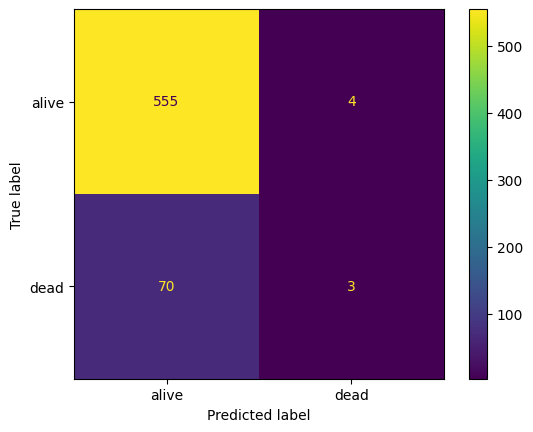

In [ ]:
#Import the packages for costructing the confusion matrix
from sklearn.metrics import confusion_matrix

#Import the packages for plotting the confusion matrix
from sklearn.metrics import ConfusionMatrixDisplay

#Costruct the confusion matrix based on…
#comparing actual values (y_test) vs predicted (y_pred) in test data
cm_knn = confusion_matrix(y_test, y_pred, labels = knn.classes_)

#Plot the confusion matrix
disp_knn_cm = ConfusionMatrixDisplay(cm_knn, display_labels=knn.classes_)
disp_knn_cm.plot()

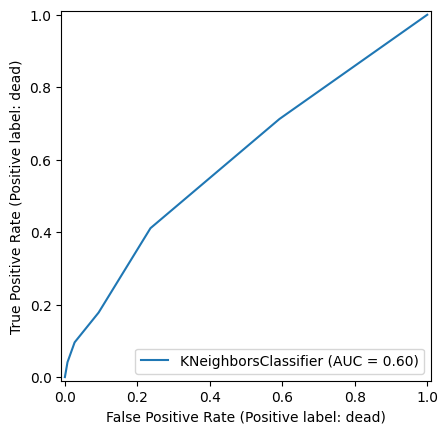

In [ ]:
from sklearn.metrics import RocCurveDisplay
knn_roc = RocCurveDisplay.from_estimator(knn, X_test, y_test)

##Naïve Bayes

In [ ]:
import numpy as np

In [ ]:
nb_df = pd.read_csv("/content/classification_dataset.csv")
nb_df.head()

,Unnamed: 0,Age,Sex,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Reginol_Node_Positive,Survival_Months,Mortality_Status
0,0,68,0,0,0,0,0,3,0,4.00,0,0,24.00,1,60,alive
1,1,50,0,1,1,2,1,2,0,35.00,0,0,14.00,5,62,alive
2,2,58,0,2,2,3,1,2,0,63.00,0,0,14.00,7,75,alive
3,3,58,0,0,0,0,0,3,0,18.00,0,0,2.00,1,84,alive
4,4,47,0,1,0,1,0,3,0,41.00,0,0,3.00,1,50,alive


In [ ]:
Differenciated_mode = nb_df['Differentiated'].mode()[0]
nb_df['Differentiated'] = nb_df['Differentiated'].fillna(Differenciated_mode)

In [ ]:
nb_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3156 entries, 0 to 3155
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Unnamed: 0              3156 non-null   int64  
 1   Age                     3156 non-null   int64  
 2   Sex                     3156 non-null   int64  
 3   T_Stage                 3156 non-null   int64  
 4   N_Stage                 3156 non-null   int64  
 5   6th_Stage               3156 non-null   int64  
 6   Differentiated          3156 non-null   int64  
 7   Grade                   3156 non-null   int64  
 8   A_Stage                 3156 non-null   int64  
 9   Tumor_Size              3156 non-null   float64
 10  Estrogen_Status         3156 non-null   int64  
 11  Progesterone_Status     3156 non-null   int64  
 12  Regional_Node_Examined  3156 non-null   float64
 13  Reginol_Node_Positive   3156 non-null   int64  
 14  Survival_Months         3156 non-null   

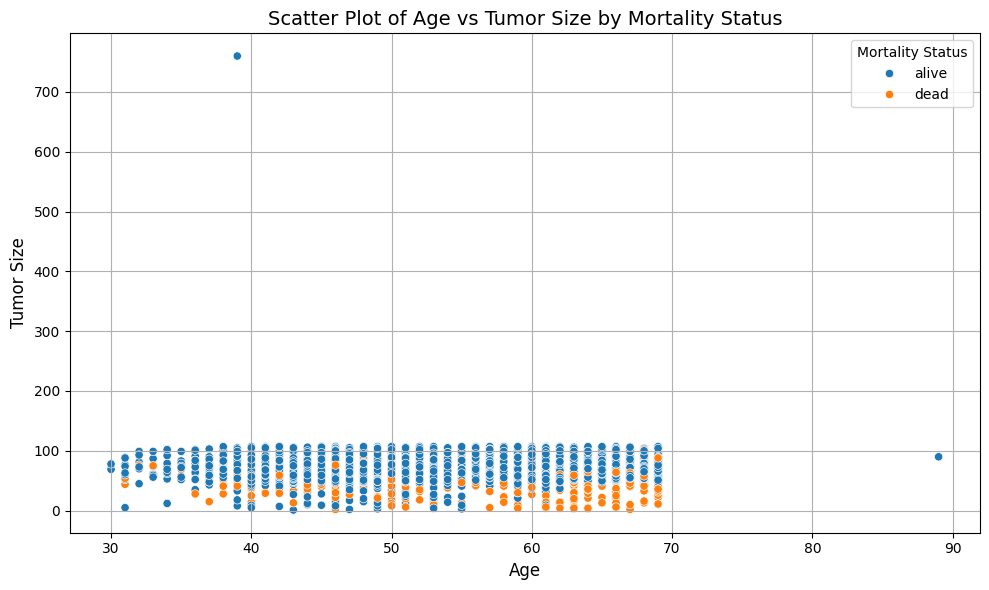

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10,6))
sns.scatterplot(
    data=nb_df,
    x='Age',
    y='Survival_Months',
    hue='Mortality_Status'
)

# Add titles and labels
plt.title("Scatter Plot of Age vs Tumor Size by Mortality Status", fontsize=14)
plt.xlabel("Age", fontsize=12)
plt.ylabel("Tumor Size", fontsize=12)
plt.legend(title="Mortality Status")
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
nb_df = nb_df.drop(columns=['Unnamed: 0'], axis=1)

In [ ]:
X = nb_df.drop(columns=['Mortality_Status'])
y = nb_df['Mortality_Status']

In [ ]:
# Perform Minimum - Maximum Normalization:
X1 = (X - np.min(X)) / ( np.max(X) - np.min(X))

In [ ]:
from sklearn.model_selection import train_test_split
X1_train, X1_test, y_train, y_test = train_test_split(X1, y, test_size = 0.3, random_state = 42)

In [ ]:
from sklearn.naive_bayes import BernoulliNB
from sklearn.metrics import accuracy_score
nb = BernoulliNB()
nb.fit(X1_train, y_train)
y_pred=nb.predict(X1_test)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       alive       0.89      1.00      0.94       841
        dead       0.00      0.00      0.00       106

    accuracy                           0.89       947
   macro avg       0.44      0.50      0.47       947
weighted avg       0.79      0.89      0.84       947



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



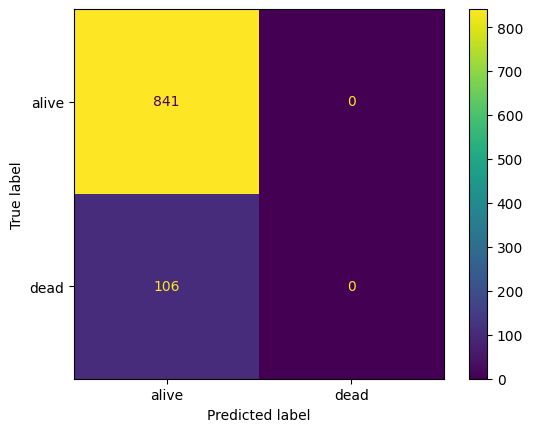

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
nb_cm = confusion_matrix(y_test, y_pred, labels = nb.classes_)
nb_cm = ConfusionMatrixDisplay(nb_cm, display_labels = nb.classes_)
nb_cm.plot()

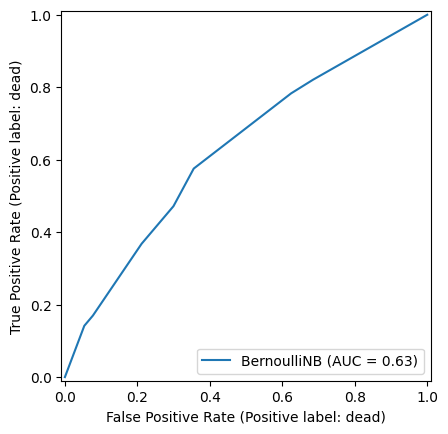

In [ ]:
from sklearn.metrics import RocCurveDisplay
nb_roc = RocCurveDisplay.from_estimator(nb, X1_test, y_test)

#**Part 3 - Regression Decision Tree and Ensemble Learner**

##Ensemble Learner

In [ ]:
import pandas as pd
classification_df = pd.read_csv("/content/classification_dataset.csv")
classification_df.head()

,Unnamed: 0,Age,Sex,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Reginol_Node_Positive,Survival_Months,Mortality_Status
0,0,68,0,0,0,0,0,3,0,4.00,0,0,24.00,1,60,alive
1,1,50,0,1,1,2,1,2,0,35.00,0,0,14.00,5,62,alive
2,2,58,0,2,2,3,1,2,0,63.00,0,0,14.00,7,75,alive
3,3,58,0,0,0,0,0,3,0,18.00,0,0,2.00,1,84,alive
4,4,47,0,1,0,1,0,3,0,41.00,0,0,3.00,1,50,alive


In [ ]:
classification_df.astype('object').describe().transpose()

,count,unique,top,freq
Unnamed: 0,3156,3156,3155,1
Age,3156,41,47,131
Sex,3156,1,0,3156
T_Stage,3156,3,1,1422
N_Stage,3156,3,0,2256
6th_Stage,3156,4,0,1111
Differentiated,3156,3,1,1941
Grade,3156,3,2,1941
A_Stage,3156,1,0,3156
Tumor_Size,3156.00,99.00,15.00,234.00


In [ ]:
X = classification_df.drop(columns=["Mortality_Status", "Survival_Months"])
y = classification_df["Mortality_Status"]

#Split data into train and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y)

In [ ]:
Differenciated_mode = X['Differentiated'].mode()[0]
X['Differentiated'] = X['Differentiated'].fillna(Differenciated_mode)

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3156 entries, 0 to 3155
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Unnamed: 0              3156 non-null   int64  
 1   Age                     3156 non-null   int64  
 2   Sex                     3156 non-null   int64  
 3   T_Stage                 3156 non-null   int64  
 4   N_Stage                 3156 non-null   int64  
 5   6th_Stage               3156 non-null   int64  
 6   Differentiated          3156 non-null   int64  
 7   Grade                   3156 non-null   int64  
 8   A_Stage                 3156 non-null   int64  
 9   Tumor_Size              3156 non-null   float64
 10  Estrogen_Status         3156 non-null   int64  
 11  Progesterone_Status     3156 non-null   int64  
 12  Regional_Node_Examined  3156 non-null   float64
 13  Reginol_Node_Positive   3156 non-null   int64  
dtypes: float64(2), int64(12)
memory usage: 3

Building Base Learner

Naïve bayes learner

In [ ]:
# import the NB algorithm, build the NB model then test it by predicting on the test data
from sklearn.naive_bayes import BernoulliNB

In [ ]:
from sklearn.impute import SimpleImputer
# X_train_df = pd.DataFrame(X_train)
imputer = SimpleImputer(strategy='mean')
X_train = imputer.fit_transform(X_train)
X_test = imputer.transform(X_test)

Classification report for NB
              precision    recall  f1-score   support

       alive       0.88      1.00      0.94       838
        dead       0.00      0.00      0.00       109

    accuracy                           0.88       947
   macro avg       0.44      0.50      0.47       947
weighted avg       0.78      0.88      0.83       947

confusion_matrix for NB


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



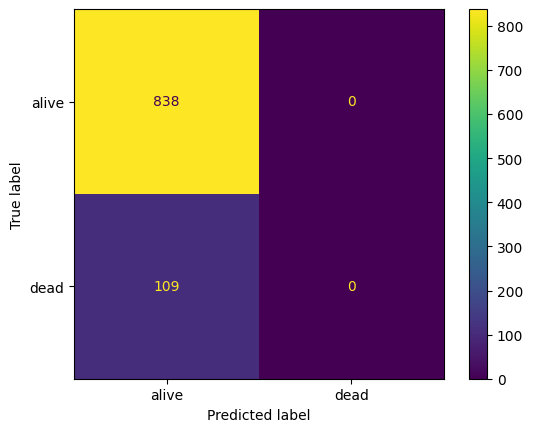

In [ ]:
nb=BernoulliNB()
nb=nb.fit(X_train,y_train)
y_pred_nb=nb.predict(X_test)

# Evaluate your NB model byt generating the classification report and the confusion matrix
from sklearn.metrics import classification_report
print("Classification report for NB")
print(classification_report(y_test,y_pred_nb))

from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

print("confusion_matrix for NB")
nb_cm=confusion_matrix(y_test,y_pred_nb)
disp=ConfusionMatrixDisplay(confusion_matrix=nb_cm,display_labels=nb.classes_)
disp.plot()

Logistic Regression learner

Classification report for LR


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



              precision    recall  f1-score   support

       alive       0.89      1.00      0.94       838
        dead       0.83      0.05      0.09       109

    accuracy                           0.89       947
   macro avg       0.86      0.52      0.51       947
weighted avg       0.88      0.89      0.84       947

confusion_matrix for lr


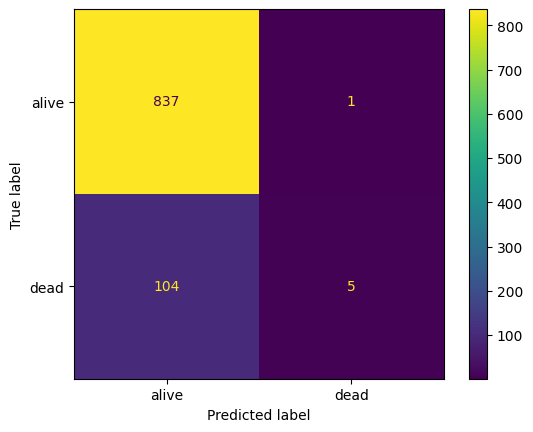

In [ ]:
# import the LR algorithm, build the LR model then test it by predicting on the test data
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
lr=lr.fit(X_train,y_train)
y_pred_lr=lr.predict(X_test)

# Evaluate your LR model byt generating the classification report and the confusion matrix
from sklearn.metrics import classification_report
print("Classification report for LR")
print(classification_report(y_test,y_pred_lr))

from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

print("confusion_matrix for lr")
lr_cm=confusion_matrix(y_test,y_pred_lr)
disp=ConfusionMatrixDisplay(confusion_matrix=lr_cm,display_labels=lr.classes_)
disp.plot()


Decision tree learner

Classification report for DT
              precision    recall  f1-score   support

       alive       0.89      0.86      0.87       838
        dead       0.15      0.20      0.17       109

    accuracy                           0.78       947
   macro avg       0.52      0.53      0.52       947
weighted avg       0.81      0.78      0.79       947

confusion_matrix for DT


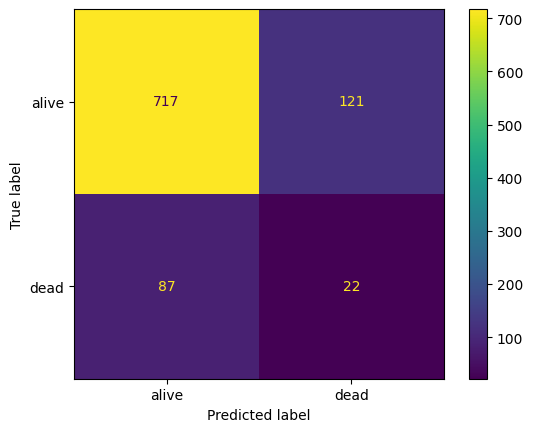

In [ ]:
# import the DT algorithm, build the DT model then test it by predicting on the test data
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier()
dt=dt.fit(X_train,y_train)
y_pred_dt=dt.predict(X_test)

# Evaluate your DT model by generating the classification report and the confusion matrix
from sklearn.metrics import classification_report
print("Classification report for DT")
print(classification_report(y_test,y_pred_dt))

from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

print("confusion_matrix for DT")
dt_cm=confusion_matrix(y_test,y_pred_dt)
disp=ConfusionMatrixDisplay(confusion_matrix=dt_cm,display_labels=dt.classes_)
disp.plot()


Voting (Hard Voting)

Using hard voting because this is a classification problem

Classification report for Ensmebler
              precision    recall  f1-score   support

       alive       0.88      1.00      0.94       838
        dead       0.00      0.00      0.00       109

    accuracy                           0.88       947
   macro avg       0.44      0.50      0.47       947
weighted avg       0.78      0.88      0.83       947

confusion_matrix for ensember learner


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-p

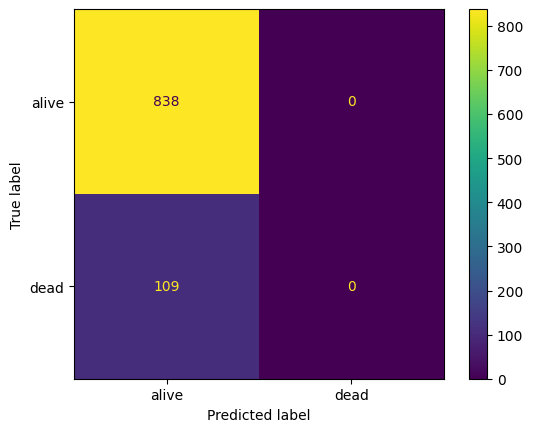

In [ ]:
#initiate a new ensemble model
from sklearn.ensemble import VotingClassifier

#create a dictionary of our base learner models
base_learners=[('NB', nb), ('LR', lr)]

#create our voting classifier, inputting our models
ensemble_learner = VotingClassifier(base_learners, voting='hard')

#fit model to training data
ensemble_learner = ensemble_learner.fit(X_train, y_train)
y_pred_ensembler = ensemble_learner.predict(X_test)

# Evaluate your ensemble model by generating the classification report and the confusion matrix
from sklearn.metrics import classification_report
print("Classification report for Ensmebler")
print(classification_report(y_test,y_pred_ensembler))

from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

print("confusion_matrix for ensember learner")
ensemble_learner_cm=confusion_matrix(y_test,y_pred_ensembler)
disp=ConfusionMatrixDisplay(confusion_matrix=ensemble_learner_cm,display_labels = ensemble_learner.classes_)
disp.plot()


##Regression Decision Tree

In [ ]:
# To transform your features into new values
from sklearn import preprocessing

# Import train_test_split function
from sklearn.model_selection import train_test_split

# To construct and plot decision trees
from sklearn import tree
from matplotlib import pyplot as plt

# Import Decision Tree Classifier to predict loan approval status
from sklearn.tree import DecisionTreeClassifier

# Import Decision Tree Regressor to predict maximum loan amount
from sklearn.tree import DecisionTreeRegressor

#To optimise the Decision Tree model's hyperparameters
from sklearn.model_selection import GridSearchCV

#Import scikit-learn metrics module for classification and regression performance metrics
from sklearn import metrics

# To create and plot the confusion matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

# To produce the classification metrics report
from sklearn.metrics import classification_report

# To create, calculate and plot the RoC curve
from sklearn.metrics import RocCurveDisplay

import plotly.express as px

In [ ]:
# To expand the truncation of rows and columns
pd.set_option('display.max_rows', 3000)
pd.set_option('display.max_columns', 3000)
pd.set_option('display.width', 150)

# To expand e scientific notation
pd.set_option('display.float_format', '{:.2f}'.format)

In [ ]:
regression_dt_df = pd.read_csv('/content/regression_dataset.csv')

In [ ]:
regression_dt_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3156 entries, 0 to 3155
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     3156 non-null   int64  
 1   Sex                     3141 non-null   object 
 2   T_Stage                 3156 non-null   object 
 3   N_Stage                 3156 non-null   object 
 4   6th_Stage               3156 non-null   object 
 5   Differentiated          3156 non-null   object 
 6   Grade                   3156 non-null   int64  
 7   A_Stage                 3156 non-null   object 
 8   Tumor_Size              3156 non-null   float64
 9   Estrogen_Status         3156 non-null   object 
 10  Progesterone_Status     3156 non-null   object 
 11  Regional_Node_Examined  3156 non-null   float64
 12  Reginol_Node_Positive   3156 non-null   int64  
 13  Survival_Months         3156 non-null   int64  
 14  Mortality_Status        3156 non-null   

In [ ]:
regression_dt_df.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Age,3156.00,NaN,NaN,NaN,53.97,8.97,30.00,47.00,54.00,61.00,89.00
Sex,3141,1,female,3141,NaN,NaN,NaN,NaN,NaN,NaN,NaN
T_Stage,3156,3,T2,1422,NaN,NaN,NaN,NaN,NaN,NaN,NaN
N_Stage,3156,3,N1,2256,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6th_Stage,3156,4,IIA,1111,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Differentiated,3156,3,Moderately differentiated,1941,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Grade,3156.00,NaN,NaN,NaN,2.08,0.62,1.00,2.00,2.00,2.00,3.00
A_Stage,3156,1,Regional,3156,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Tumor_Size,3156.00,NaN,NaN,NaN,28.88,19.71,1.00,15.00,23.00,35.00,140.00
Estrogen_Status,3156,1,Positive,3156,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
regression_dt_df.isna().sum()/len(regression_dt_df)*100

,0
Age,0.00
Sex,0.48
T_Stage,0.00
N_Stage,0.00
6th_Stage,0.00
Differentiated,0.00
Grade,0.00
A_Stage,0.00
Tumor_Size,0.00
Estrogen_Status,0.00


In [ ]:
#Create a function to find the outlier data points
def find_outliers_IQR(regression_dt_df):
  q1=regression_dt_df.quantile(0.25)
  q3=regression_dt_df.quantile(0.75)
  IQR=q3-q1
  outliers = regression_dt_df[((regression_dt_df<(q1-1.5*IQR)) | (regression_dt_df>(q3+1.5*IQR)))]
  return outliers


In [ ]:
# Find the outlier data points in the age variable
age_outliers = find_outliers_IQR(regression_dt_df['Age'])
print("number of outliers: "+ str(len(age_outliers)))
print("max outlier value: "+ str(age_outliers.max()))
print("min outlier value: "+ str(age_outliers.min()))
age_outliers.sort_values(ascending=False)

number of outliers: 1
max outlier value: 89
min outlier value: 89


,Age
651,89


In [ ]:
# # Find the outlier data points in the age variable
# differenciated_outliers = find_outliers_IQR(regression_dt_df['Differentiated'])
# print("number of outliers: "+ str(len(differenciated_outliers)))
# print("max outlier value: "+ str(differenciated_outliers.max()))
# print("min outlier value: "+ str(differenciated_outliers.min()))
# differenciated_outliers.sort_values(ascending=False)


In [ ]:
regression_dt_df.drop(regression_dt_df.index[[826]], inplace=True)

In [ ]:
age_fig = px.box(regression_dt_df, x='Age')
sex_fig = px.box(regression_dt_df, x='Sex')
Differenciated_fig = px.box(regression_dt_df, x='Differentiated')


age_fig.show()
sex_fig.show()
Differenciated_fig.show()


In [ ]:
# # Import label encoder
# from sklearn import preprocessing
# label_encoder = preprocessing.LabelEncoder()

# # Encode the categories in each object variable to a numeric form
# regression_dt_df['home_ownership']= label_encoder.fit_transform(regression_dt_df['home_ownership'])
# regression_dt_df['loan_intent']= label_encoder.fit_transform(regression_dt_df['loan_intent'])
# regression_dt_df['payment_default_on_file']= label_encoder.fit_transform(regression_dt_df['payment_default_on_file'])

# # Check the categories' labels after the label encoding transformation is completed
# print("New labels for home_ownership are: ", regression_dt_df['home_ownership'].unique())
# print("New labels for loan_intent are: ", regression_dt_df['loan_intent'].unique())
# print("New labels for payment_default_on_file are: ", regression_dt_df['payment_default_on_file'].unique())


In [ ]:

# Calculate the mean of each variable
Mean_age = regression_dt_df['Age'].mean()

# use the mean to impute the missing values in each variable
regression_dt_df['Age'].fillna(Mean_age, inplace=True)


<ipython-input-299-4c05897828b7>:5: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [ ]:
regression_dt_df.to_csv(r'/content/prepared_regression_data.csv', index=False)

In [ ]:
#Load your prepared dataset as df
df = pd.read_csv('/content/prepared_regression_data.csv')

# Keep the target for classification and drop only the regression target max_allowed_loan
# df.drop('max_allowed_loan',axis=1, inplace=True)
df.head()


,Age,Sex,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Reginol_Node_Positive,Survival_Months,Mortality_Status
0,68,female,T1,N1,IIA,Poorly differentiated,3,Regional,4.00,Positive,Positive,24.00,1,60,alive
1,50,female,T2,N2,IIIA,Moderately differentiated,2,Regional,35.00,Positive,Positive,14.00,5,62,alive
2,58,female,T3,N3,IIIC,Moderately differentiated,2,Regional,63.00,Positive,Positive,14.00,7,75,alive
3,58,female,T1,N1,IIA,Poorly differentiated,3,Regional,18.00,Positive,Positive,2.00,1,84,alive
4,47,female,T2,N1,IIB,Poorly differentiated,3,Regional,41.00,Positive,Positive,3.00,1,50,alive


In [ ]:
#Save your classification dataset under the name loan_approval_status_data
df.to_csv(r'/content/prepared_regression_status_data.csv', index=False)


In [ ]:
#load your fully prepared dataset as df2
df2=pd.read_csv('/content/prepared_regression_data.csv')

# Filter approved applicants (loan_approval_status for status = 0) in a new data frame called approved_loan_applicants
# approved_loan_applicants =  df2[(df2.loan_approval_status < 1)]

# Check the basic stats to observe only approved applicants remain
# approved_loan_applicants.describe().transpose()


Classification Modelling

In [ ]:
df_loan_status = pd.read_csv('/content/prepared_regression_status_data.csv')
df_loan_status.head()

,Age,Sex,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Reginol_Node_Positive,Survival_Months,Mortality_Status
0,68,female,T1,N1,IIA,Poorly differentiated,3,Regional,4.00,Positive,Positive,24.00,1,60,alive
1,50,female,T2,N2,IIIA,Moderately differentiated,2,Regional,35.00,Positive,Positive,14.00,5,62,alive
2,58,female,T3,N3,IIIC,Moderately differentiated,2,Regional,63.00,Positive,Positive,14.00,7,75,alive
3,58,female,T1,N1,IIA,Poorly differentiated,3,Regional,18.00,Positive,Positive,2.00,1,84,alive
4,47,female,T2,N1,IIB,Poorly differentiated,3,Regional,41.00,Positive,Positive,3.00,1,50,alive


In [ ]:
# Split the dataset in 60% Training and 40% Test with class stratification
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=43, stratify=y)

In [ ]:
# Build a fully grown decision tree clf
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)

#To make predictions on the test set, ues the predict method:
y_pred_clf = clf.predict(X_test)

#You can size your plot then plot the fully grown classification tree
Unpruned_Tree_figure = plt.figure(figsize=(200,200))
DT_Graph = tree.plot_tree(clf, feature_names=list(X_train.columns), class_names = ['0','1'], filled=True)

In [ ]:
# To find the full depth of the decision tree
print(clf.tree_.max_depth)


22


In [ ]:
#To save the DT graph
Unpruned_Tree_figure.savefig("fully_grown_decistion_tree.svg")


In [ ]:
# Create Decision Tree classifer object
clf_pruned = DecisionTreeClassifier(max_depth = 4)

# Train Decision Tree Classifer
clf_pruned = clf_pruned.fit(X_train,y_train)

#Predict the response for test dataset
y_pred_clf_pruned = clf_pruned.predict(X_test)

#You can size your plot then plot the pruned classification tree
pruned_Tree_figure = plt.figure(figsize=(200,200))
DT_Graph = tree.plot_tree(clf_pruned, feature_names=list(X_train.columns), class_names = ['0','1'], filled=True)

#To save the pruned DT graph
pruned_Tree_figure.savefig("pruned_decistion_tree.png")


clf fully grown tree report 
               precision    recall  f1-score   support

       alive       0.89      0.86      0.88      1117
        dead       0.14      0.16      0.15       146

    accuracy                           0.78      1263
   macro avg       0.51      0.51      0.51      1263
weighted avg       0.80      0.78      0.79      1263



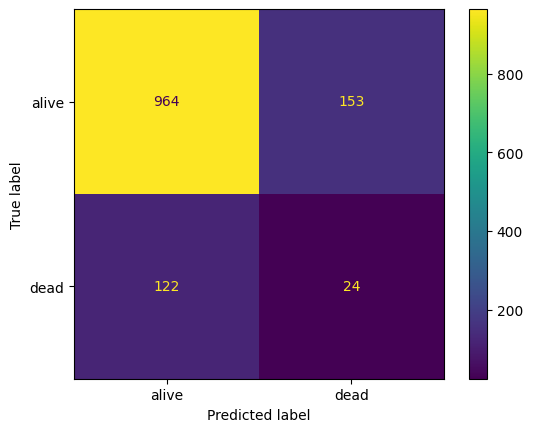

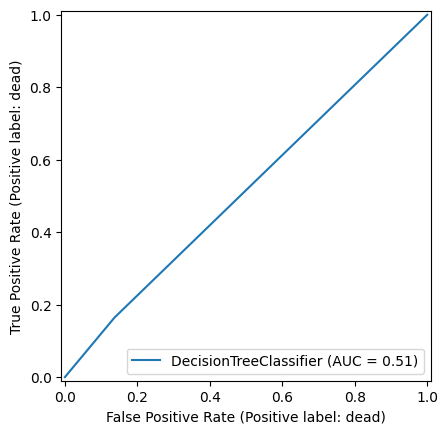

In [ ]:
# Construct and plot the confusion matrix for the fuly-grown tree (clf model)
clf_cm_test = confusion_matrix(y_test, y_pred_clf, labels=clf.classes_ )
disp = ConfusionMatrixDisplay(clf_cm_test,display_labels=clf.classes_   )
disp.plot(values_format = '.0f') # value_format = .0f expands the scientific notation e inside the confusion matrix

# Produce the classification report for the fuly-grown tree (clf model)
print("clf fully grown tree report \n", classification_report(y_test, y_pred_clf))

# Plot the ROC curve for the fully-grown treen
clf_Roc = RocCurveDisplay.from_estimator(clf, X_test, y_test)


clf_pruned tree report 
               precision    recall  f1-score   support

       alive       0.89      0.98      0.93      1117
        dead       0.32      0.08      0.12       146

    accuracy                           0.87      1263
   macro avg       0.61      0.53      0.53      1263
weighted avg       0.82      0.87      0.84      1263



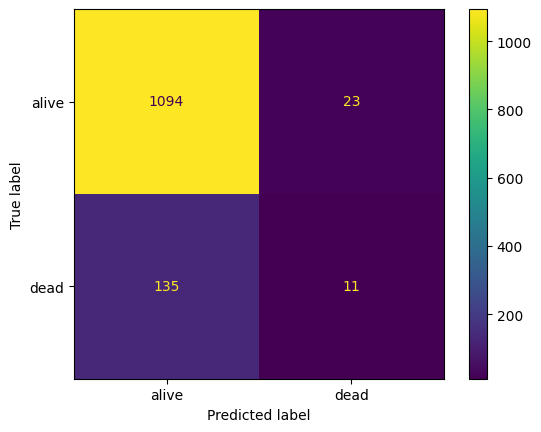

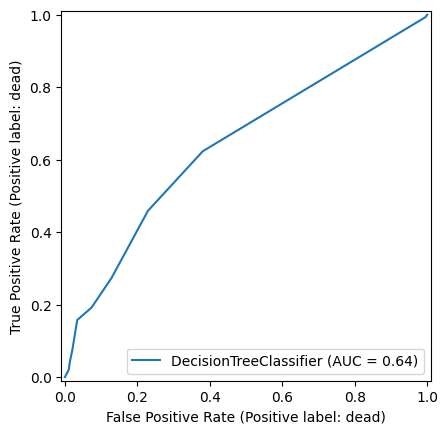

In [ ]:
# Construct and plot the confusion matrix for the pruned tree (clf_pruned model)
clf_pruned_cm_test = confusion_matrix(y_test, y_pred_clf_pruned, labels = clf_pruned.classes_)
disp = ConfusionMatrixDisplay(clf_pruned_cm_test,display_labels = clf_pruned.classes_)
disp.plot(values_format = '.0f')

# Produce the classification report for the prunded tree (clf_pruned model)
print("clf_pruned tree report \n", classification_report(y_test, y_pred_clf_pruned))

# Plot the ROC curve for the pruned treen
clf_pruned_Roc = RocCurveDisplay.from_estimator(clf_pruned, X_test, y_test)
